In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
import jieba
from wordcloud import WordCloud
import json
import random
import statistics

In [50]:
# 观影数小于200的将会被过滤
FILTER_MOVIE = 200
# 随机选取用户做模型评估
EVAL_NUM = 10
# CF_METHOD = "pearson"
CF_METHOD = "kendall"
# CF_METHOD = "spearman"

# 读取文件

In [3]:
pd_rMap = pd.read_csv("../output/D_JoinedOneHotYearRateOnehotData.csv")
pd_rMap_NonOH = pd.read_csv("../output/E_JoinedOneHotYearRateNonOnehotData.csv")

In [4]:
df_image_rMap = pd_rMap.copy()
df_image_rMap.head(3)

,userId,movieId,rating,ratingTime,title,genres,Action,Adventure,Animation,Children,...,rHour_14,rHour_15,rHour_16,rHour_17,rHour_18,rHour_19,rHour_20,rHour_21,rHour_22,rHour_23
0,102763,3448,4.5,2013-10-20 01:44:41,"Good Morning, Vietnam (1987)",Comedy|Drama|War,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,113693,46578,4.5,2011-04-08 23:12:38,Little Miss Sunshine (2006),Adventure|Comedy|Drama,False,True,False,False,...,False,False,False,False,False,False,False,False,False,True
2,112675,4519,4.0,2014-06-22 07:52:42,"Land Before Time, The (1988)",Adventure|Animation|Children|Fantasy,False,True,True,True,...,False,False,False,False,False,False,False,False,False,False


In [5]:
df_image_rMap_NoOH = pd_rMap_NonOH.copy()
df_image_rMap_NoOH.head(3)

,userId,movieId,rating,ratingTime,title,genres,Action,Adventure,Animation,Children,...,Sci-Fi,Thriller,War,Western,Others,titleMap,rYear,rMonth,rDay,rHour
0,102763,3448,4.5,2013-10-20 01:44:41,"Good Morning, Vietnam (1987)",Comedy|Drama|War,False,False,False,False,...,False,False,True,False,False,1987,2013,10,20,1
1,113693,46578,4.5,2011-04-08 23:12:38,Little Miss Sunshine (2006),Adventure|Comedy|Drama,False,True,False,False,...,False,False,False,False,False,2006,2011,4,8,23
2,112675,4519,4.0,2014-06-22 07:52:42,"Land Before Time, The (1988)",Adventure|Animation|Children|Fantasy,False,True,True,True,...,False,False,False,False,False,1988,2014,6,22,7


# 定义词云生成函数

In [6]:
def WordCould(df_orgin = pd_rMap_NonOH, user_id = 118205):
    df_watchedMovie = df_orgin[df_orgin["userId"]==user_id]
    list_m = df_watchedMovie["genres"].values.tolist()
    j=[]
    for i in range(len(list_m)):
        words = jieba.cut(list_m[i])
        for s in words:
            j.append(s)
    wc = WordCloud(
        font_path='simhei.ttf',     #字体路劲
        background_color='white',   #背景颜色
        # width=1000,
        # height=1000,
        # max_font_size=300,            #字体大小
        # min_font_size=10,
        # max_words=100,
        # collocations=False,
        # font_step=1
    )
    #这里云图 传入数据必须是带有空格的才能识别
    s=wc.generate(' '.join(j))
    #必须有这个才会显示图
    plt.imshow(s)
    #去除横纵坐标轴
    plt.axis('off')
    plt.show()

# 按照用户ID合并数据

In [7]:
genres = ["Action", "Adventure", "Animation", "Children", "Comedy", "Crime", "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror", "Musical", "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western", "Others"]
df_R1_Genres =  pd.DataFrame(pd_rMap_NonOH[genres].astype("int"), columns = genres)
df_R1_Genres.index = pd.Series(pd_rMap_NonOH["userId"])
df_indexNumber = pd.DataFrame(df_R1_Genres.index.value_counts())
df_indexNumber = df_indexNumber[df_indexNumber['userId']>=FILTER_MOVIE]

In [8]:
df_sum = pd.DataFrame(columns=genres)
for e in df_indexNumber.index:
    df_m = pd.DataFrame(df_R1_Genres[df_R1_Genres.index == e].sum(axis=0)).T
    df_sum = pd.concat([df_sum, df_m], axis=0)
df_sum = df_sum.astype("int")
df_sum.index = pd.Series(df_indexNumber.index)

In [9]:
df_sum

,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Others
118205,141,112,20,50,346,129,35,518,36,24,48,41,33,200,53,156,63,42,0
8405,114,105,41,49,267,85,42,377,55,11,56,41,64,132,60,135,47,27,0
82418,89,62,19,31,235,80,35,318,37,12,25,35,31,125,31,86,39,17,0
125794,112,76,11,28,158,87,41,306,42,4,49,16,36,71,46,148,25,17,0
74142,130,78,39,46,230,83,16,206,44,0,64,19,38,92,66,120,14,11,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56504,58,37,7,7,65,35,2,87,13,6,25,4,19,27,32,55,8,6,0
129540,55,27,4,9,85,28,4,78,17,2,19,3,13,30,20,44,7,3,0
11900,72,42,16,18,57,28,4,66,23,0,40,11,20,30,35,59,10,7,0
4507,29,36,16,29,98,21,3,91,23,2,6,12,8,39,15,33,9,8,0


# 持久化 用户——电影 字典

In [10]:
df_ER = pd_rMap_NonOH.copy()
dict_ER = {}
for e in df_sum.index.tolist():
    df_m = df_ER[df_ER["userId"]==e]
    dict_ER[e] = df_m["movieId"].values.tolist()
json.dump(dict_ER, open('data/Dict_UIDkey_MidValue.json','w'))

# 划分训练预测数据集字典，并持久化

In [11]:
dict_train = {}
dict_test = {}
for key, v in dict_ER.items():
    trainNum = int(len(v)*0.7)
    trainMovie = v[:trainNum]
    testMovie = v[trainNum : len(v)]
    dict_train[key] = trainMovie
    dict_test[key] = testMovie
json.dump(dict_train, open('data/Dict_train.json','w'))
json.dump(dict_test, open('data/dict_test.json','w'))

In [12]:
df_R_train = pd.DataFrame(columns=genres)
for k, vs in dict_test.items():
    df_m = pd_rMap_NonOH[pd_rMap_NonOH["userId"]== k]
    for v in vs:
        df_m = df_m[df_m["movieId"] != v]
    df_m = pd.DataFrame(df_m[genres].astype("int"), columns = genres)
    df_m = pd.DataFrame(df_m.sum(axis=0)).T
    df_m.index = pd.Series(k)
    df_R_train = pd.concat([df_R_train, df_m], axis = 0)
df_R_train


,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Others
118205,110,81,18,38,244,85,25,353,23,20,32,32,20,130,38,105,51,32,0
8405,80,73,32,36,197,51,34,251,40,5,36,33,39,91,40,86,36,17,0
82418,66,46,13,23,160,55,29,220,26,9,16,24,28,83,23,66,28,12,0
125794,71,49,7,20,122,62,29,211,26,4,37,10,25,47,30,103,16,13,0
74142,96,51,30,30,161,62,8,145,25,0,42,16,25,67,47,85,12,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56504,35,22,5,4,49,24,2,60,11,5,21,3,14,18,19,33,7,3,0
129540,39,18,2,6,59,21,4,52,13,1,15,2,8,19,15,28,5,2,0
11900,50,25,11,11,39,21,3,50,18,0,32,7,14,22,24,38,6,6,0
4507,19,24,10,21,70,14,1,64,15,2,3,9,7,32,12,24,7,5,0


In [13]:
df_R_train = df_R_train.astype("int")

# 基于用户的推荐

In [52]:
user_corr_df = df_R_train.T.corr(method=CF_METHOD)
user_corr_df

,118205,8405,82418,125794,74142,131904,121535,34576,59477,79159,...,66649,16606,45015,117395,33402,56504,129540,11900,4507,3858
118205,1.000000,0.984520,0.993340,0.953683,0.910076,0.925152,0.949899,0.789388,0.852951,0.971434,...,0.913125,0.975404,0.962413,0.960350,0.936130,0.907822,0.897388,0.748732,0.933163,0.854185
8405,0.984520,1.000000,0.990837,0.950988,0.929030,0.934477,0.930563,0.824103,0.881523,0.964277,...,0.926953,0.972587,0.976687,0.972665,0.959789,0.916721,0.913985,0.770474,0.955883,0.864730
82418,0.993340,0.990837,1.000000,0.952799,0.910611,0.927346,0.944523,0.794408,0.851523,0.970767,...,0.907100,0.982654,0.968674,0.957804,0.929355,0.902617,0.899557,0.735986,0.938943,0.859130
125794,0.953683,0.950988,0.952799,1.000000,0.904903,0.957453,0.974130,0.875961,0.905489,0.969882,...,0.931475,0.937742,0.930365,0.919917,0.929214,0.947215,0.902681,0.826753,0.858047,0.957068
74142,0.910076,0.929030,0.910611,0.904903,1.000000,0.866489,0.844699,0.897776,0.960380,0.940171,...,0.958909,0.859037,0.965588,0.966636,0.930554,0.961441,0.983645,0.891699,0.920010,0.851086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56504,0.907822,0.916721,0.902617,0.947215,0.961441,0.924541,0.902867,0.926627,0.965421,0.951379,...,0.960840,0.872738,0.926485,0.936381,0.926621,1.000000,0.969094,0.925850,0.849578,0.916281
129540,0.897388,0.913985,0.899557,0.902681,0.983645,0.852878,0.827327,0.885726,0.954654,0.927543,...,0.952658,0.841485,0.937393,0.952357,0.911472,0.969094,1.000000,0.900034,0.890736,0.843877
11900,0.748732,0.770474,0.735986,0.826753,0.891699,0.806542,0.753951,0.868104,0.905051,0.812128,...,0.899008,0.690981,0.788505,0.816424,0.842084,0.925850,0.900034,1.000000,0.701529,0.856187
4507,0.933163,0.955883,0.938943,0.858047,0.920010,0.830408,0.831182,0.772051,0.844074,0.909516,...,0.899574,0.906342,0.965131,0.974098,0.930803,0.849578,0.890736,0.701529,1.000000,0.742808


In [53]:
def UserGenresBased_recommemd(pd_rMap_NonOH = pd_rMap_NonOH, user_corr_df = user_corr_df, user_id = 74142, top_n = 10):
    if user_id not in pd_rMap_NonOH.values[:,:1]:
        print("There is no such a user for the id "+str(user_id))
        return
    sim_user_series = user_corr_df.sort_values(by=user_id, ascending= False)[user_id]
    sim_user_dict = sim_user_series.iloc[1:2].to_dict()
    sim_user_dict = {key: value for key, value in sim_user_dict.items() if value > 0.5}
    df_result = pd.DataFrame()
    keep_columns = ['userId', 'movieId', 'rating', 'title', 'genres']
    for k in sim_user_dict.keys():
        # print(k) 
        df_m = pd_rMap_NonOH[pd_rMap_NonOH["userId"] == k].sort_values(by=['rating'], ascending=False)
        df_m = df_m[keep_columns]
        df_result = pd.concat([df_result, df_m], axis=0)
    # Mask thoes movies that have been watched by this user
    # filt_movid = pd.DataFrame(pd_rMap_NonOH[pd_rMap_NonOH["userId"] == user_id]['movieId'])
    # for e in filt_movid['movieId']:
    #     df_result = df_result[df_result['movieId']!=e]
    df_result = df_result.drop(columns=['userId'])
    df_result.sort_values(by='rating', ascending=False, inplace=True)
    df_result.drop_duplicates(subset='movieId', inplace= True)
    df_result.index = pd.Series(range(len(df_result)))+1
    # df_result.drop(columns=['rating'], inplace=True)
    print("This is the worldcould for user "+str(user_id))
    WordCould(user_id=user_id)
    if len(df_result) < top_n:
        print("There is no enough movies, we will recomand you "+str(len(df_result))+" movies")
        top_n = len(df_result)
    print("Hello, User "+str(user_id)+ "! According to your watching movies, we recommend you the folling movies: ")
    # print(df_result.iloc[:top_n, :])
    return df_result.iloc[:top_n, :]

This is the worldcould for user 74142


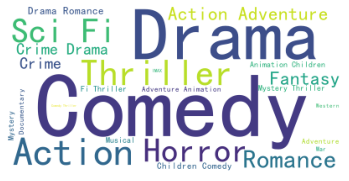

Hello, User 74142! According to your watching movies, we recommend you the folling movies: 


,movieId,rating,title,genres
1,1673,5.0,Boogie Nights (1997),Drama
2,923,5.0,Citizen Kane (1941),Drama|Mystery
3,111,5.0,Taxi Driver (1976),Crime|Drama|Thriller
4,1198,5.0,Raiders of the Lost Ark (Indiana Jones and the...,Action|Adventure
5,1266,4.5,Unforgiven (1992),Drama|Western
6,82459,4.5,True Grit (2010),Western
7,955,4.5,Bringing Up Baby (1938),Comedy|Romance
8,2890,4.5,Three Kings (1999),Action|Adventure|Comedy|Drama|War
9,2571,4.0,"Matrix, The (1999)",Action|Sci-Fi|Thriller
10,38304,4.0,No Direction Home: Bob Dylan (2005),Documentary


In [54]:
UserGenresBased_recommemd()

# 基于电影类型的推荐

In [55]:
genres_corr_df = df_R_train.corr(method=CF_METHOD)
genres_corr_df

,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Others
Action,1.000000,0.801112,0.443524,0.374597,0.519666,0.573694,0.080254,0.248400,0.530017,0.057378,0.406538,0.162545,0.334116,0.220093,0.688758,0.689560,0.379791,0.413152,0.089984
Adventure,0.801112,1.000000,0.640139,0.627436,0.568938,0.405496,0.129598,0.283484,0.709348,0.109892,0.379192,0.400932,0.278830,0.338289,0.645390,0.513353,0.421028,0.467851,0.005048
Animation,0.443524,0.640139,1.000000,0.766000,0.400250,0.146216,0.170367,0.094909,0.668448,-0.004091,0.350776,0.405819,0.168982,0.187888,0.549339,0.229396,0.128328,0.122665,0.004962
Children,0.374597,0.627436,0.766000,1.000000,0.537860,0.074787,0.117090,0.116135,0.665357,0.029887,0.300120,0.440738,0.094128,0.289769,0.418256,0.166442,0.129986,0.161451,-0.061647
Comedy,0.519666,0.568938,0.400250,0.537860,1.000000,0.581915,0.327387,0.623913,0.445636,0.326630,0.350264,0.574494,0.413361,0.745703,0.365163,0.513175,0.439762,0.444590,0.087778
Crime,0.573694,0.405496,0.146216,0.074787,0.581915,1.000000,0.387659,0.699616,0.182428,0.535268,0.300887,0.286900,0.658611,0.480205,0.290433,0.802957,0.531884,0.450463,0.169362
Documentary,0.080254,0.129598,0.170367,0.117090,0.327387,0.387659,1.000000,0.571619,0.130442,0.367453,0.103278,0.329177,0.329993,0.334371,0.060099,0.261003,0.387034,0.212476,0.125840
Drama,0.248400,0.283484,0.094909,0.116135,0.623913,0.699616,0.571619,1.000000,0.147563,0.606625,0.132189,0.574058,0.575380,0.798226,0.073752,0.555933,0.712475,0.498375,0.133866
Fantasy,0.530017,0.709348,0.668448,0.665357,0.445636,0.182428,0.130442,0.147563,1.000000,-0.026414,0.469627,0.353952,0.260518,0.217106,0.579585,0.351628,0.118763,0.106120,-0.018025
Film-Noir,0.057378,0.109892,-0.004091,0.029887,0.326630,0.535268,0.367453,0.606625,-0.026414,1.000000,0.104609,0.410204,0.480806,0.428111,0.012976,0.348215,0.531680,0.396542,0.117775


In [56]:
def GenresUserBased_recommemd(pd_rMap_NonOH = pd_rMap_NonOH, genres_corr_df = genres_corr_df, user_id = 118205, top_n = 10):
    user_act = df_sum.loc[user_id]
    m = genres_corr_df.loc[user_act[user_act >0].index]
    m = pd.DataFrame(m[user_act[user_act > 0].index].sum(axis=0))
    keep_columns = ['userId', 'movieId', 'rating', 'title', 'genres']
    m = m.sort_values(by=0, ascending=False)
    df_result2 = df_sum.sort_values(by=m.index[0:3].values.tolist(),ascending=False)
    df_result2 = df_result2[df_result2.index != user_id]
    i = 0
    df_finR2 = pd.DataFrame()
    for k in df_result2.index.values.tolist():
        df_m = pd_rMap_NonOH[pd_rMap_NonOH['userId'] == k]
        df_m = df_m[keep_columns]
        df_finR2 = pd.concat([df_finR2, df_m], axis=0)
        i = i+1
        if i > top_n:
            break
    # Mask thoes movies that have been watched by this user
    # df_watchedMovie = pd_rMap_NonOH[pd_rMap_NonOH["userId"]==user_id]
    # for e in df_watchedMovie["movieId"]:
    #     df_finR2 = df_finR2[df_finR2["movieId"] != e]
    df_finR2 = df_finR2.drop(columns=['userId'])
    df_finR2.sort_values(by='rating', ascending=False, inplace=True)
    df_finR2.drop_duplicates(subset='movieId', inplace= True)
    df_finR2.index = pd.Series(range(len(df_finR2)))+1
    # df_finR2.drop(columns=['rating'], inplace=True)
    print("This is the worldcould for user "+str(user_id))
    WordCould(user_id=user_id)
    if len(df_finR2) < top_n:
        print("There is no enough movies, we will recomand you "+str(len(df_finR2))+" movies")
        top_n = len(df_finR2)
    print("Hello, User "+str(user_id)+ "! According to your favoriate genres, we recommend you the folling movies: ")
    # print(df_finR2.iloc[:top_n, :])
    return df_finR2.iloc[:top_n, :]

This is the worldcould for user 118205


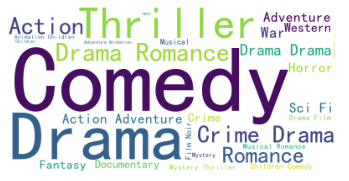

Hello, User 118205! According to your favoriate genres, we recommend you the folling movies: 


,movieId,rating,title,genres
1,348,5.0,Bullets Over Broadway (1994),Comedy
2,2237,5.0,Without Limits (1998),Drama
3,1953,5.0,"French Connection, The (1971)",Action|Crime|Thriller
4,946,5.0,To Be or Not to Be (1942),Comedy|Drama|War
5,4779,5.0,Go Tigers! (2001),Documentary
6,2398,5.0,Miracle on 34th Street (1947),Comedy|Drama
7,7440,5.0,Paper Clips (2004),Documentary
8,4361,5.0,Tootsie (1982),Comedy|Romance
9,361,5.0,It Could Happen to You (1994),Comedy|Drama|Romance
10,497,5.0,Much Ado About Nothing (1993),Comedy|Romance


In [57]:
GenresUserBased_recommemd()

# 效果评估

## 定义评估方案

In [58]:
def PrecisionRecall(rank, items):
    '''准确率和召回率'''
    hit = 0
    precision = 0
    recall = 0
    # for user, items in items.items():
        # rank = Recommend(user, N)
        # print(rank)
    hit += len(set(rank).intersection(set(items)))
    precision += len(rank)
    recall += len(items)
    return [hit / precision, hit / recall]

# 随机采样 20 个数据点

In [59]:
# testIndex=random.sample(dict_test.keys(), EVAL_NUM)

## 基于用户CF算法评估

This is the worldcould for user 89299


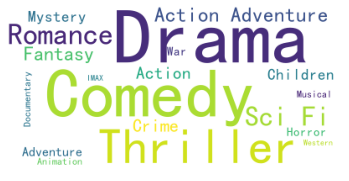

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


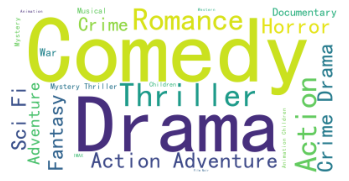

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


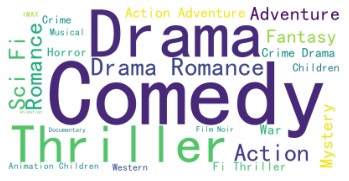

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


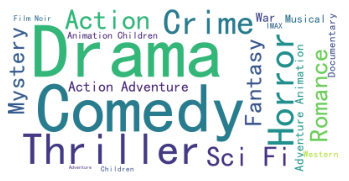

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


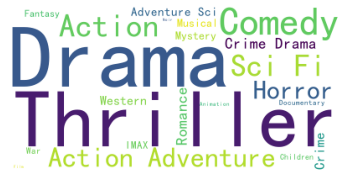

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


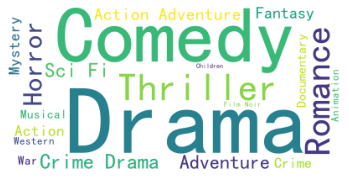

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


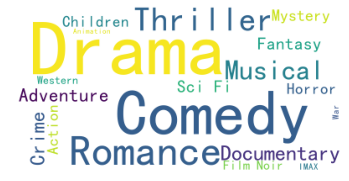

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


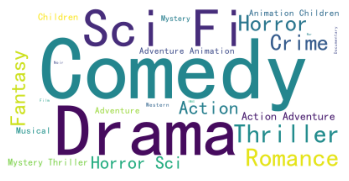

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


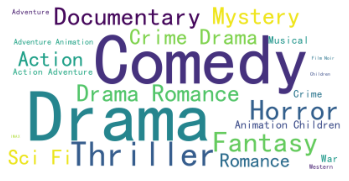

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


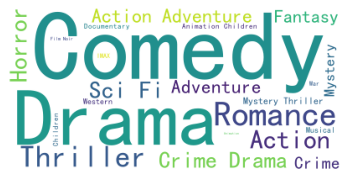

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


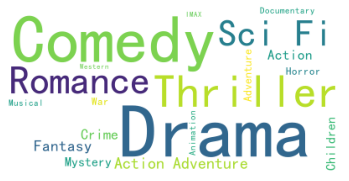

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


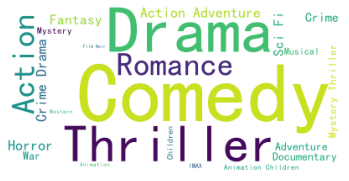

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


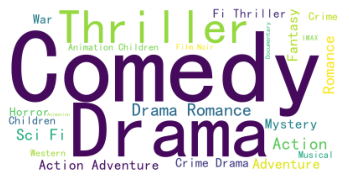

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


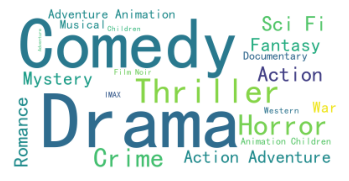

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


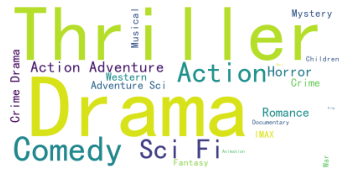

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


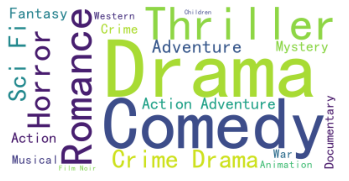

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


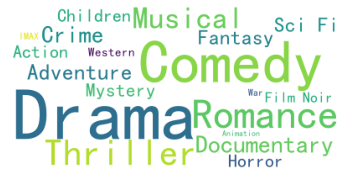

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


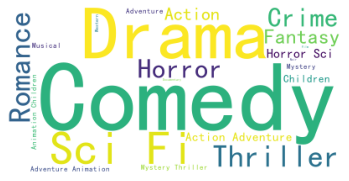

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


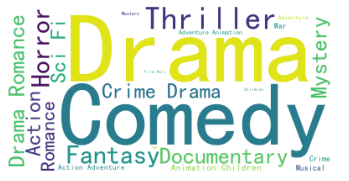

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


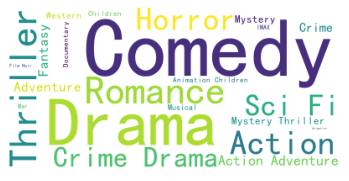

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


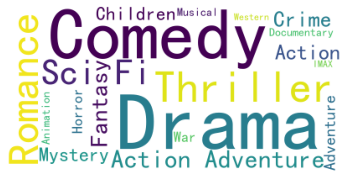

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


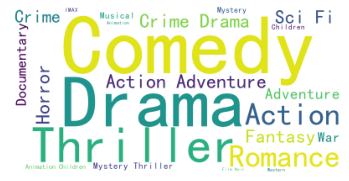

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


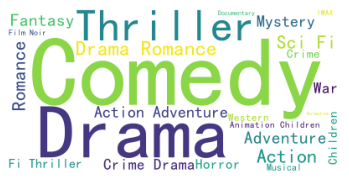

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


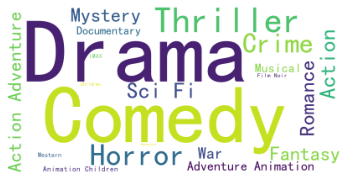

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


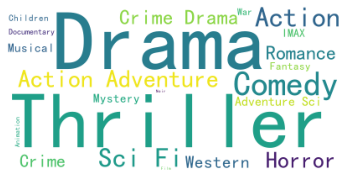

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


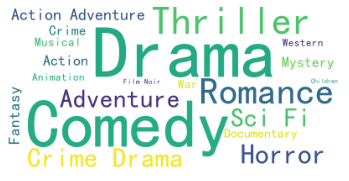

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


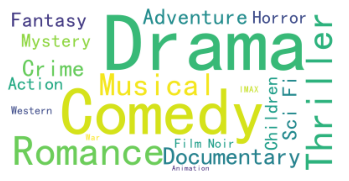

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


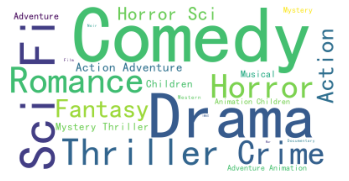

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


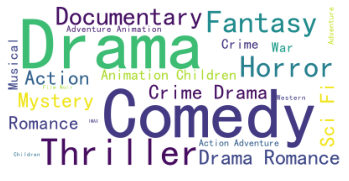

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


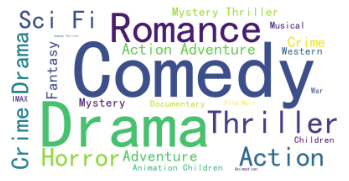

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


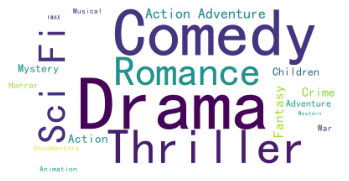

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


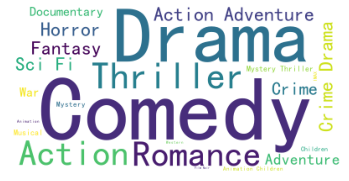

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


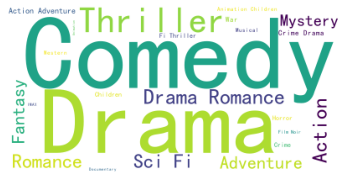

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


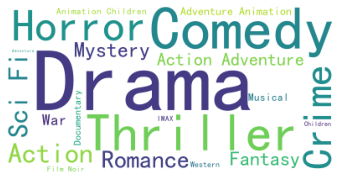

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


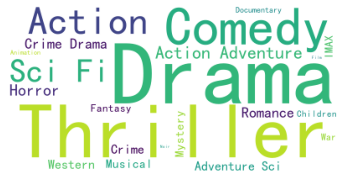

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


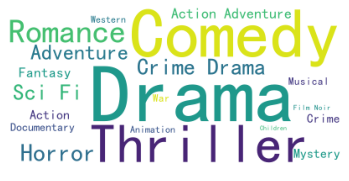

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


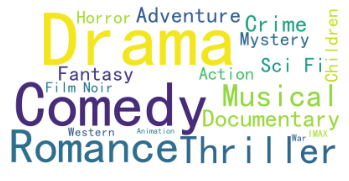

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


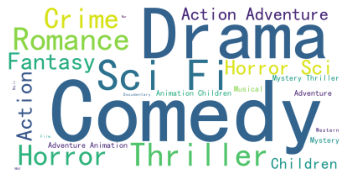

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


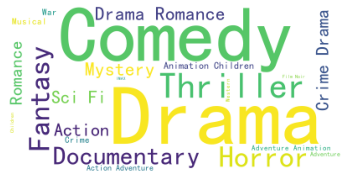

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


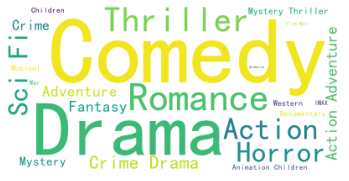

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


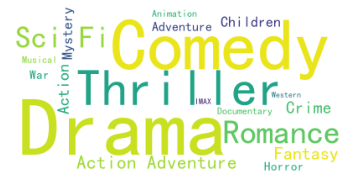

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


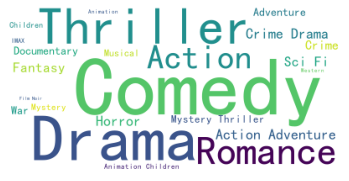

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


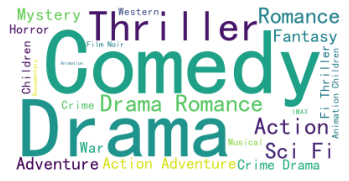

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


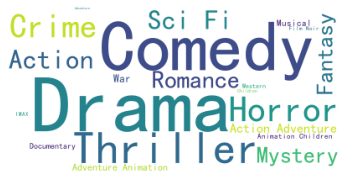

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


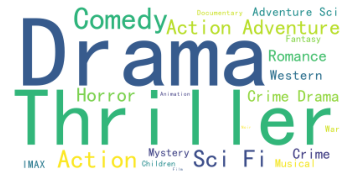

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


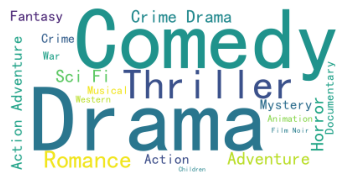

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


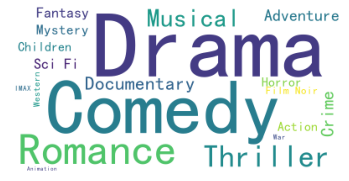

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


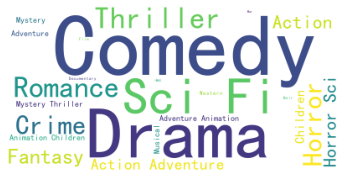

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


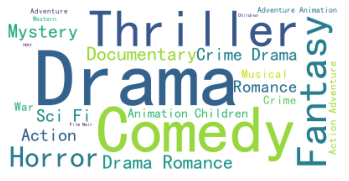

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


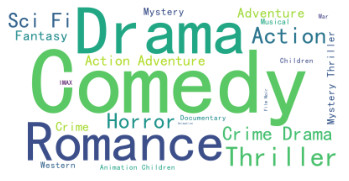

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


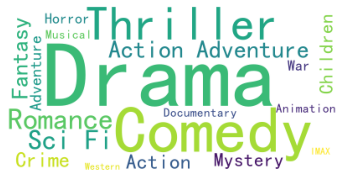

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


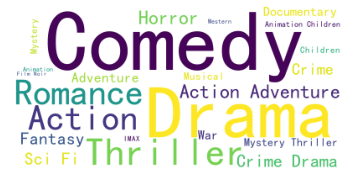

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


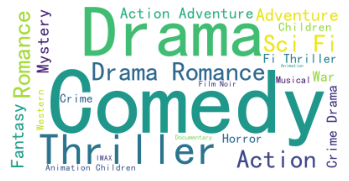

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


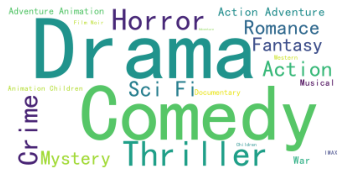

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


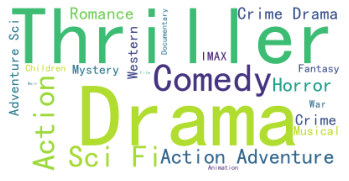

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


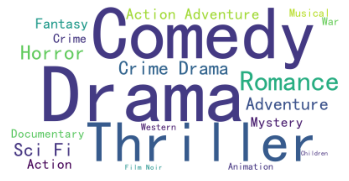

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


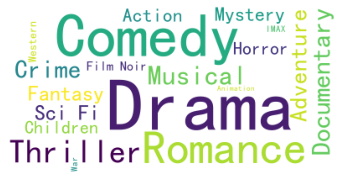

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


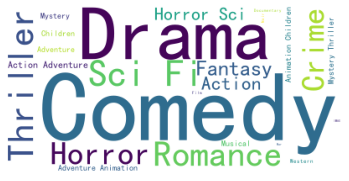

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


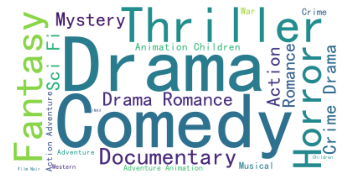

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


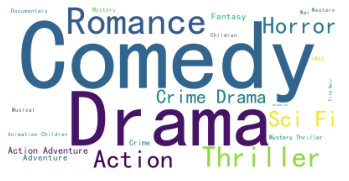

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


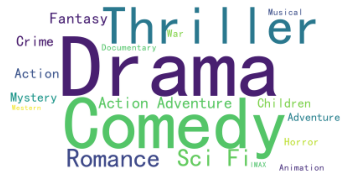

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


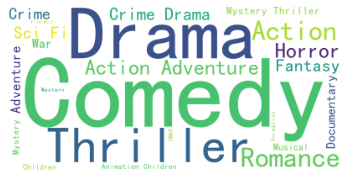

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


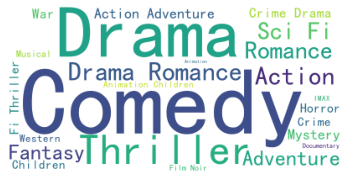

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


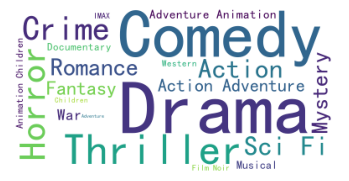

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


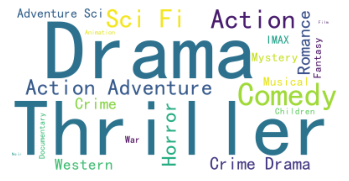

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


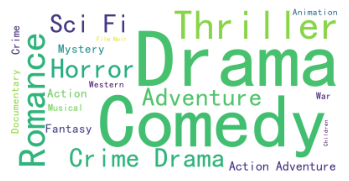

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


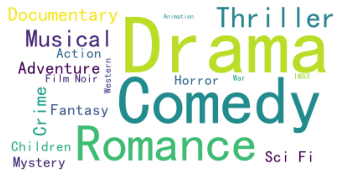

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


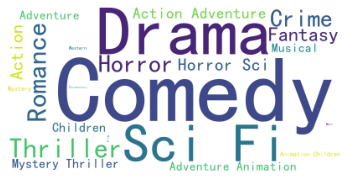

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


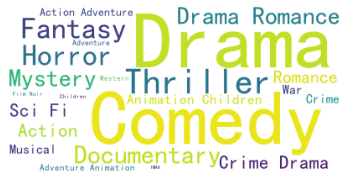

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


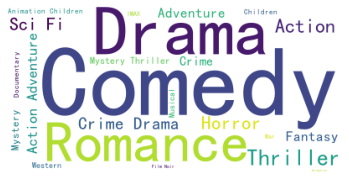

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


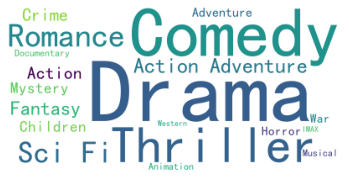

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


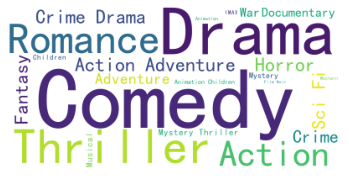

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


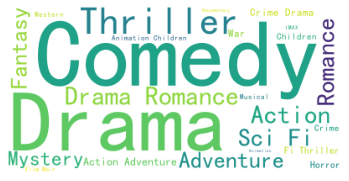

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


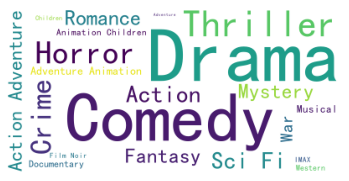

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


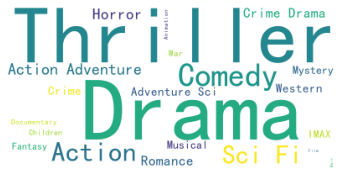

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


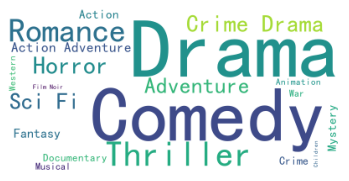

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


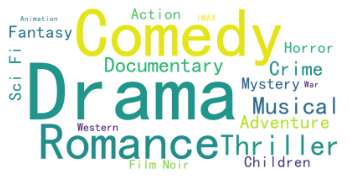

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


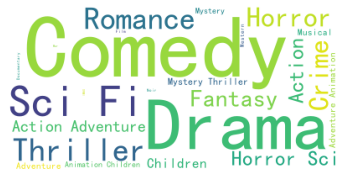

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


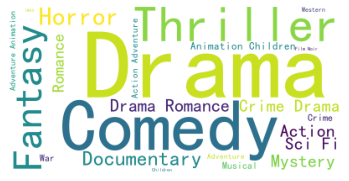

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


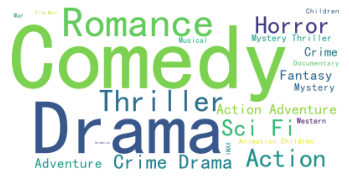

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


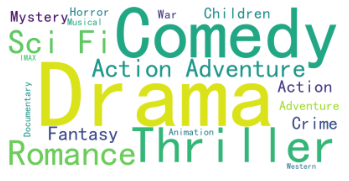

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


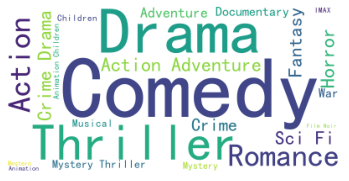

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


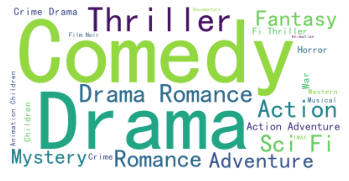

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


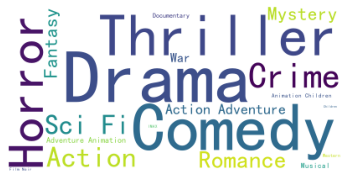

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


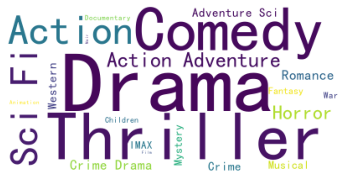

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


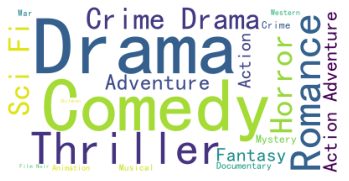

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


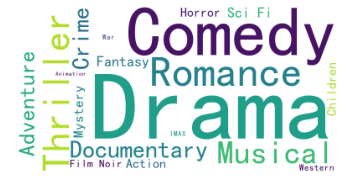

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


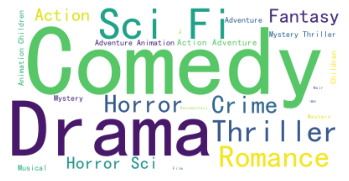

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


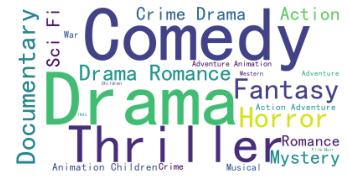

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


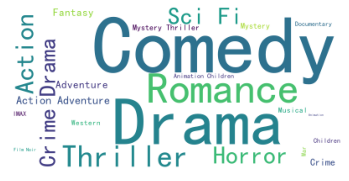

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


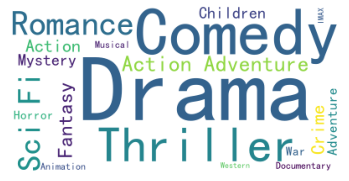

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


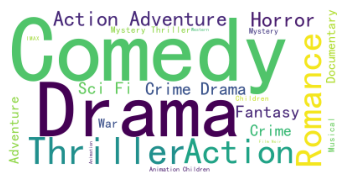

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


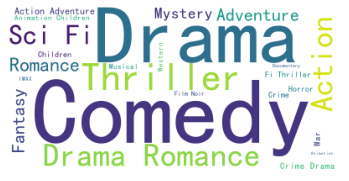

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


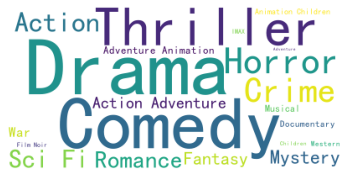

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


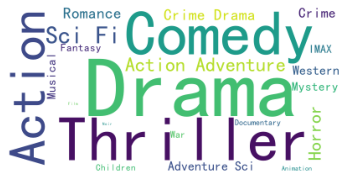

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


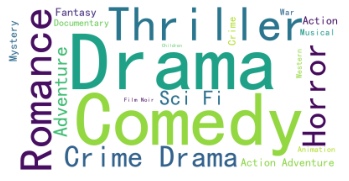

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


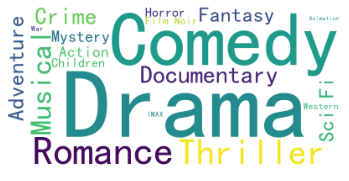

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


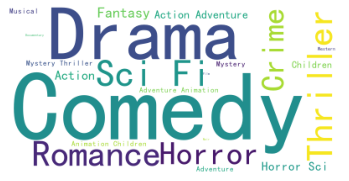

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


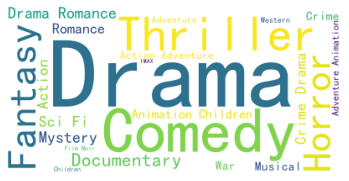

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


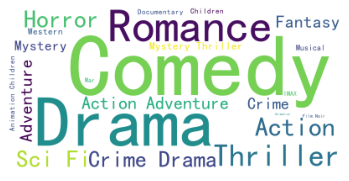

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


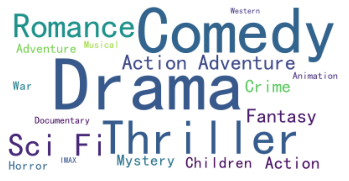

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


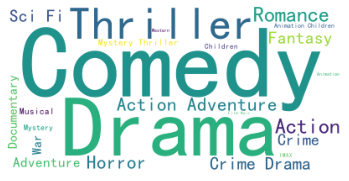

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


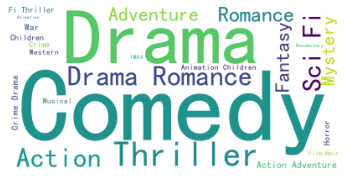

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


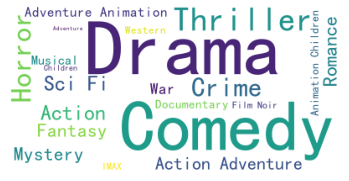

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


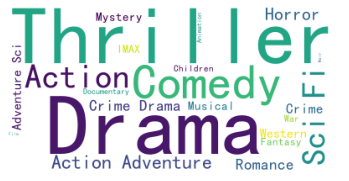

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


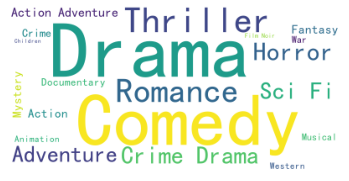

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


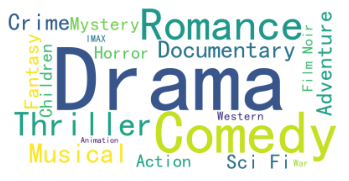

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


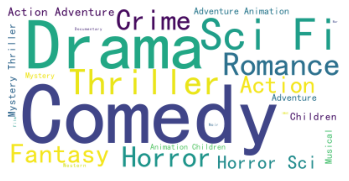

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


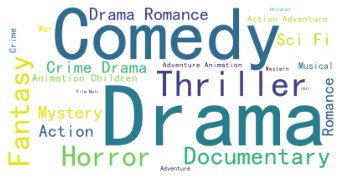

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


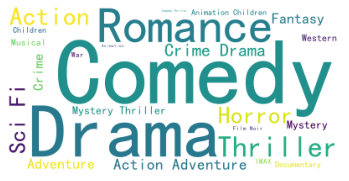

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 89299


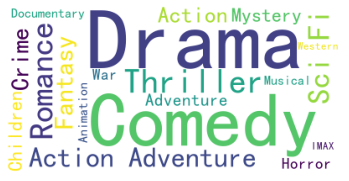

Hello, User 89299! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 131961


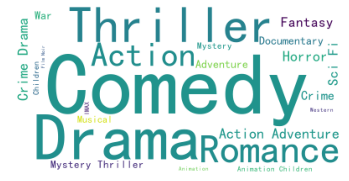

Hello, User 131961! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 92269


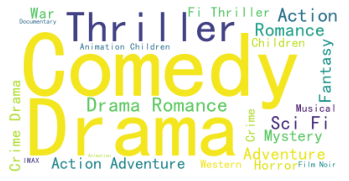

Hello, User 92269! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 46396


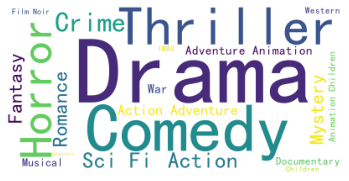

Hello, User 46396! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 80920


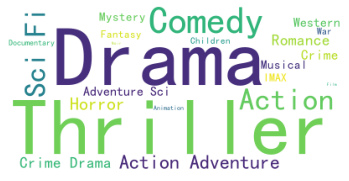

Hello, User 80920! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 50297


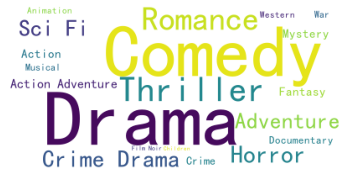

Hello, User 50297! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 65401


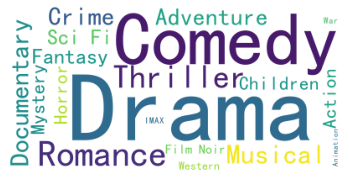

Hello, User 65401! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 45987


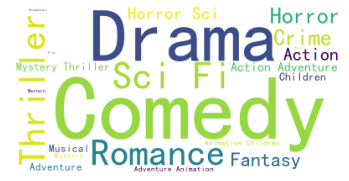

Hello, User 45987! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 114406


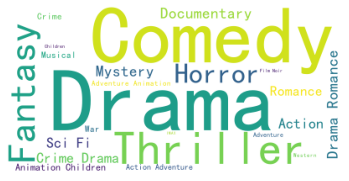

Hello, User 114406! According to your watching movies, we recommend you the folling movies: 
This is the worldcould for user 18138


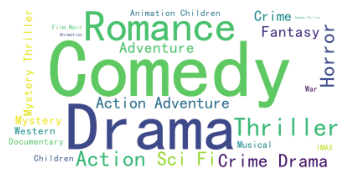

Hello, User 18138! According to your watching movies, we recommend you the folling movies: 


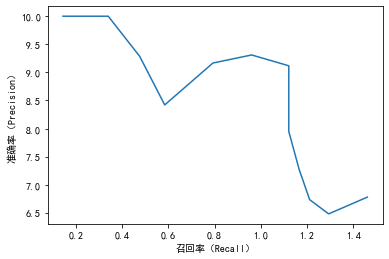

In [60]:
x = []
y = []
for n in range(4, 60, 5):    
    x1 = []
    y1 = []
    for i in testIndex:
        rank = UserGenresBased_recommemd(user_id = i, top_n = n)["movieId"].values.tolist()
        items = dict_ER[i]
        Precision, Recall = PrecisionRecall(rank = rank, items = items)
        x1.append(Recall*100)
        y1.append(Precision*100)
    x.append(statistics.mean(x1))
    y.append(statistics.mean(y1))
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.xlabel("召回率（Recall）")
plt.ylabel("准确率（Precision）")
plt.plot(x, y)
plt.savefig("../output/imgs/UserCF_P-R_"+CF_METHOD+".png")
plt.show()

## 基于GenresCF的算法评估

This is the worldcould for user 89299


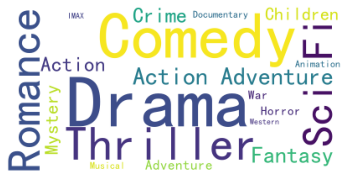

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


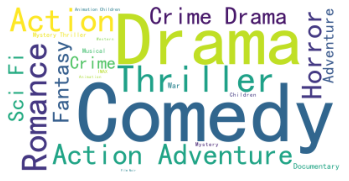

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


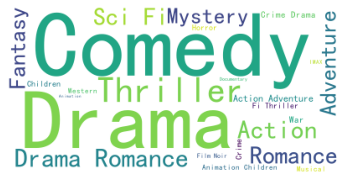

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


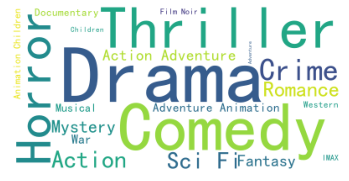

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


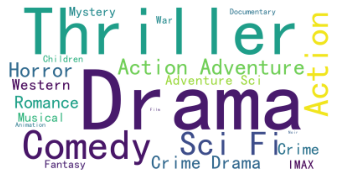

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


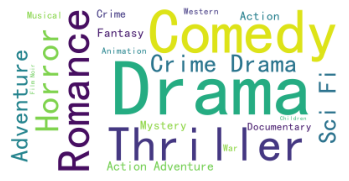

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


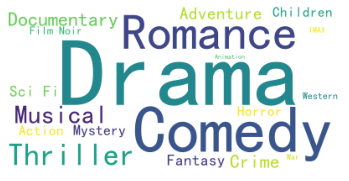

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


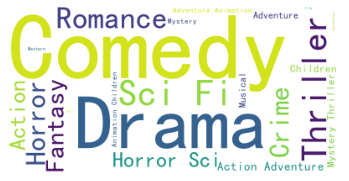

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


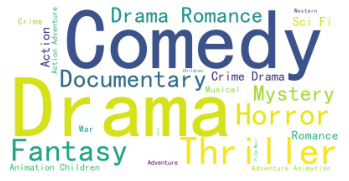

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


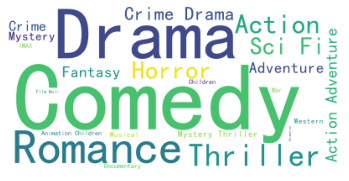

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


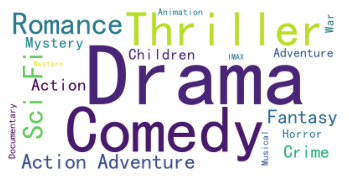

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


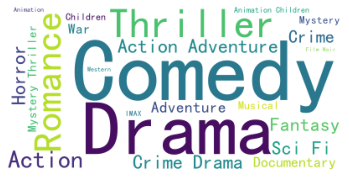

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


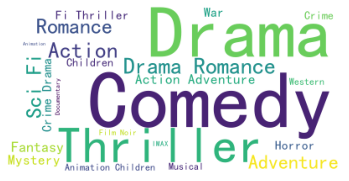

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


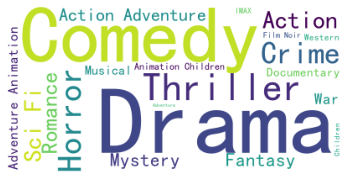

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


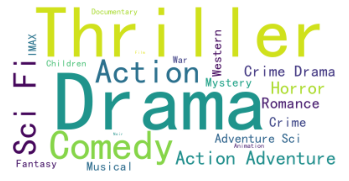

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


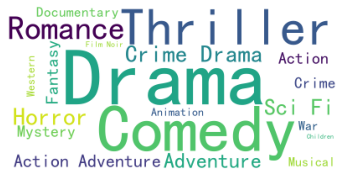

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


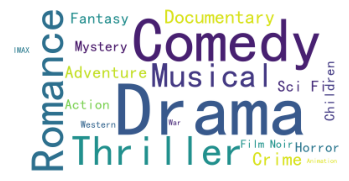

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


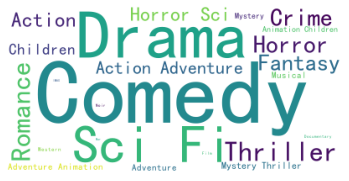

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


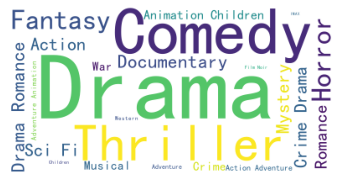

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


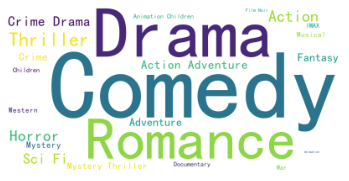

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


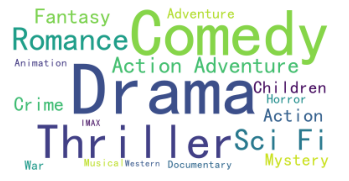

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


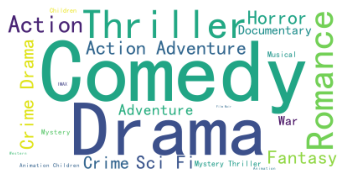

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


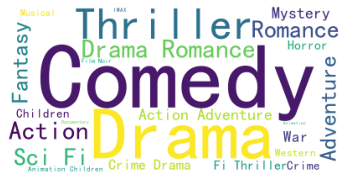

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


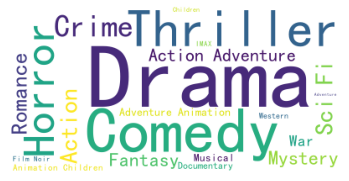

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


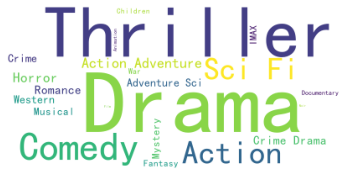

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


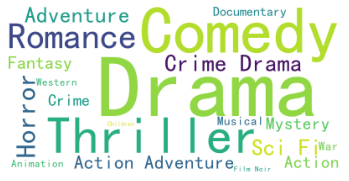

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


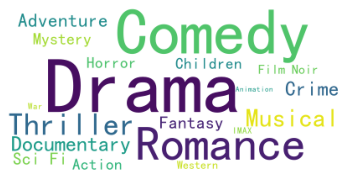

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


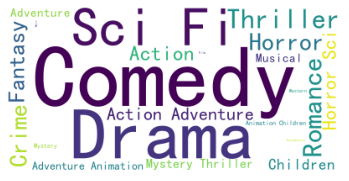

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


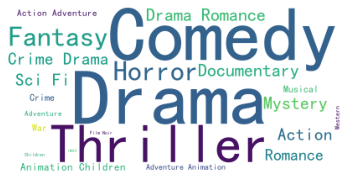

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


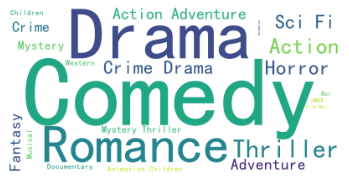

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


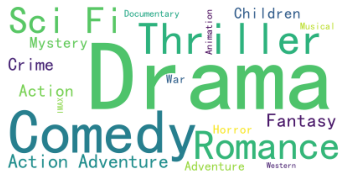

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


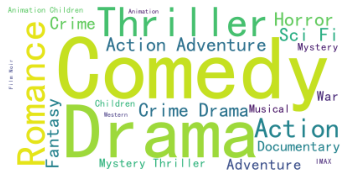

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


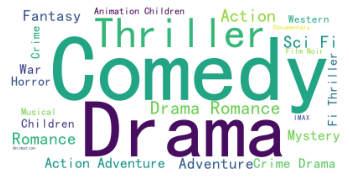

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


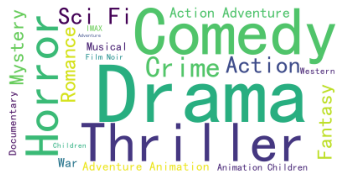

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


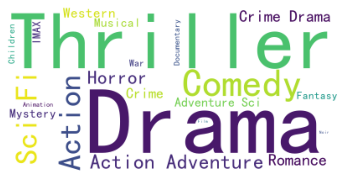

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


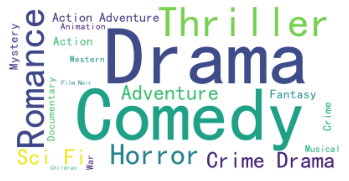

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


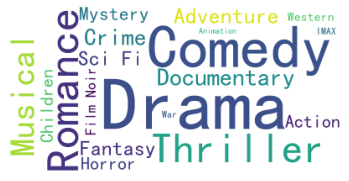

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


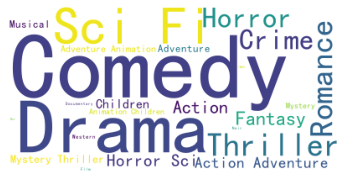

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


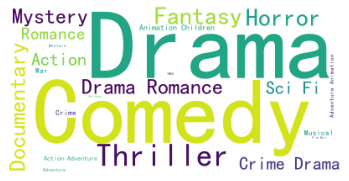

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


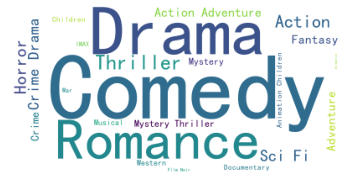

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


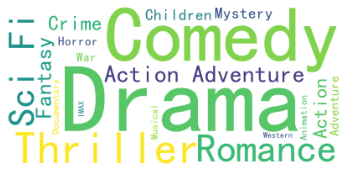

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


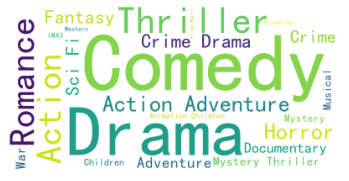

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


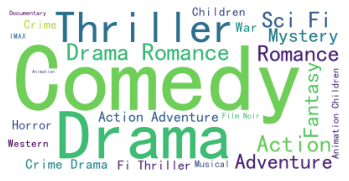

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


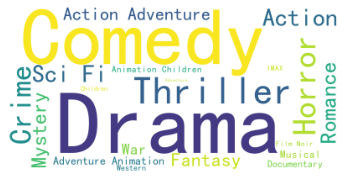

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


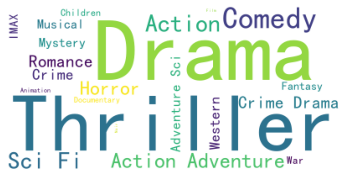

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


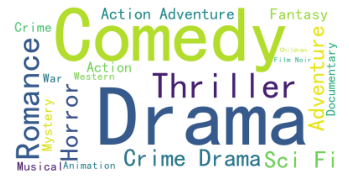

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


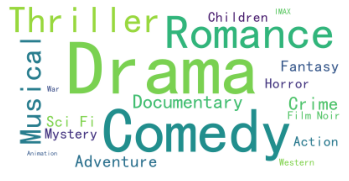

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


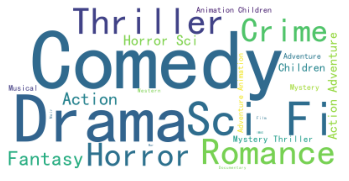

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


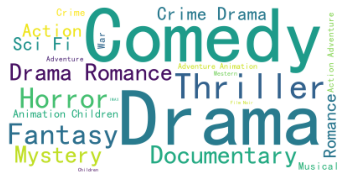

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


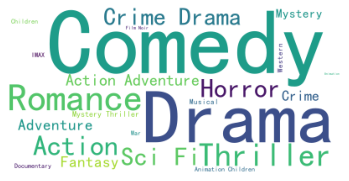

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


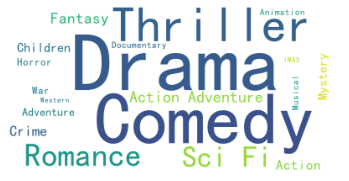

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


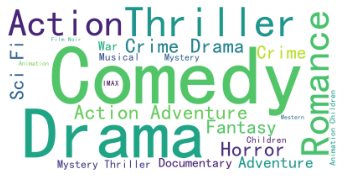

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


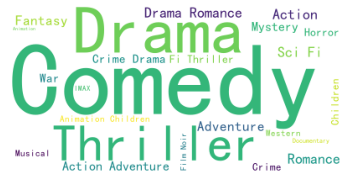

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


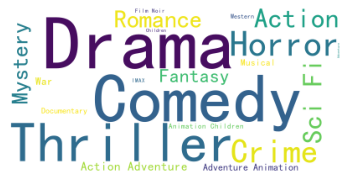

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


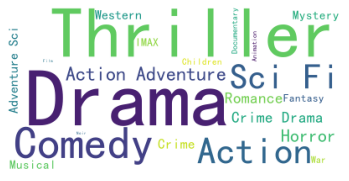

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


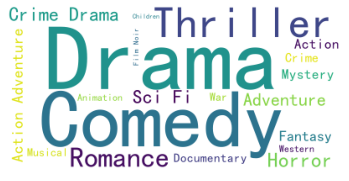

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


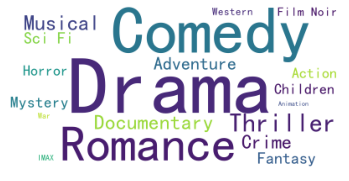

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


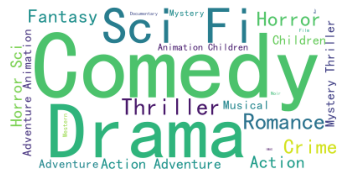

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


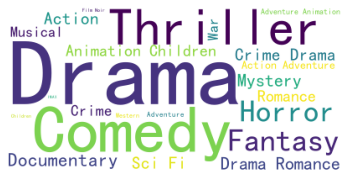

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


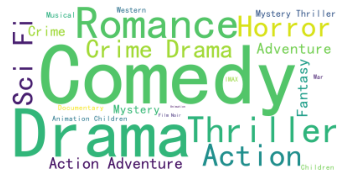

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


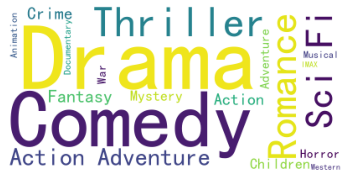

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


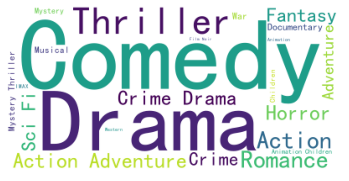

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


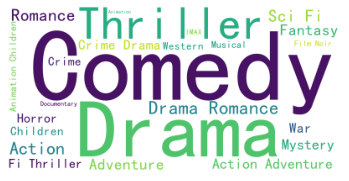

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


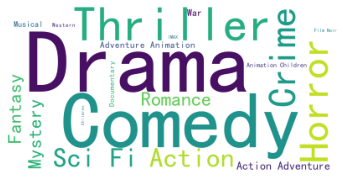

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


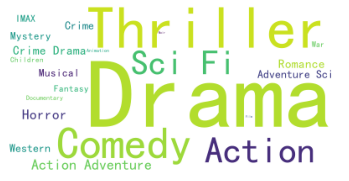

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


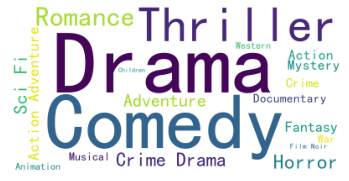

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


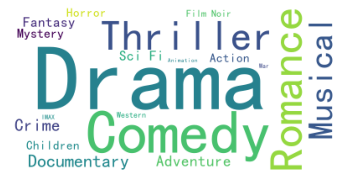

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


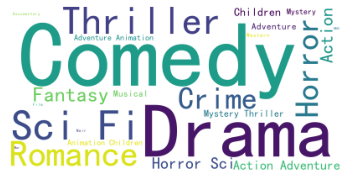

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


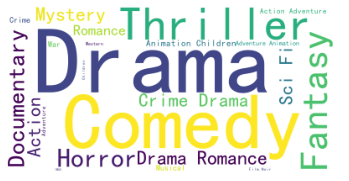

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


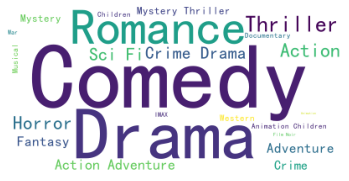

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


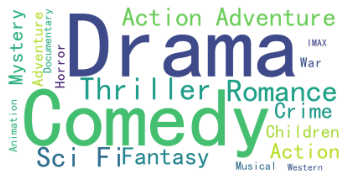

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


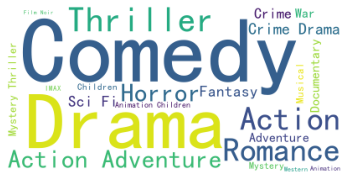

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


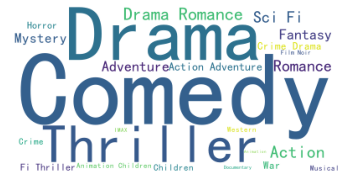

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


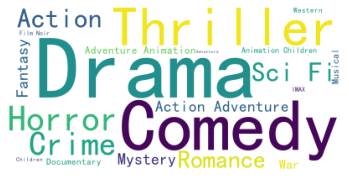

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


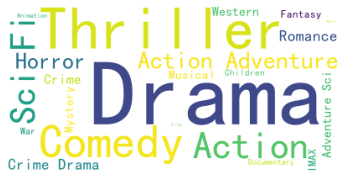

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


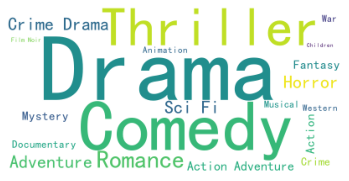

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


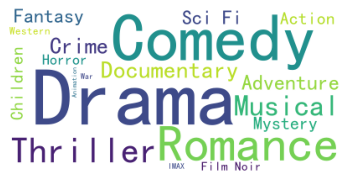

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


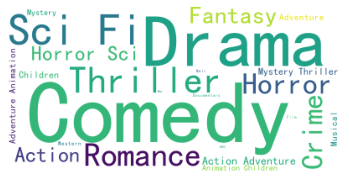

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


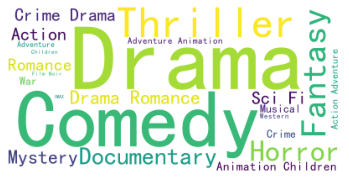

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


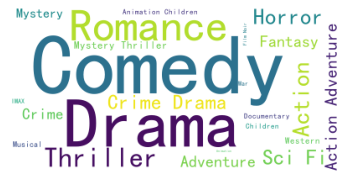

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


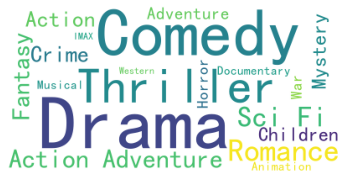

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


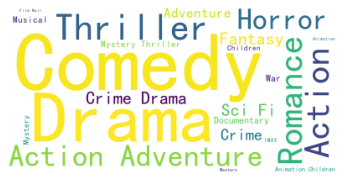

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


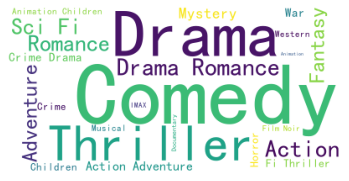

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


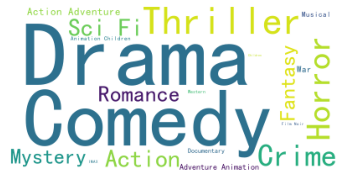

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


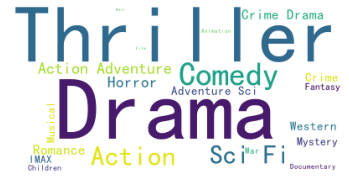

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


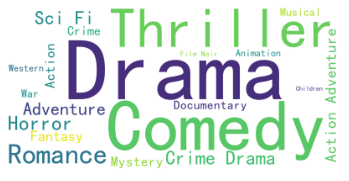

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


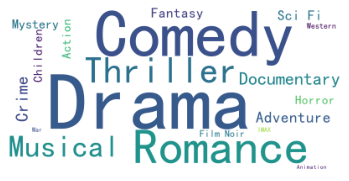

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


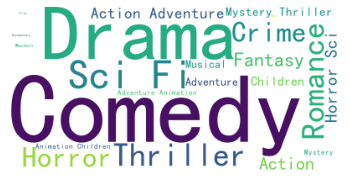

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


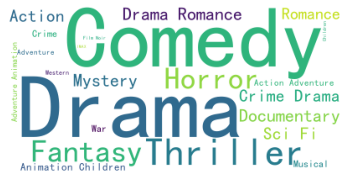

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


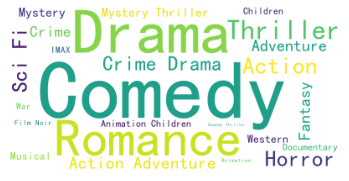

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


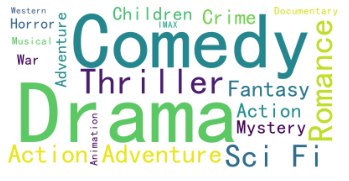

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


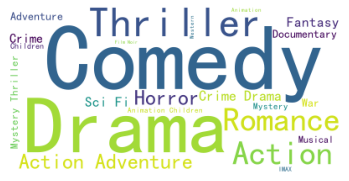

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


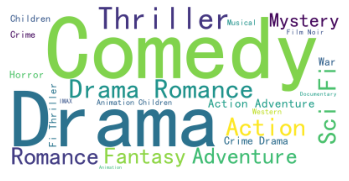

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


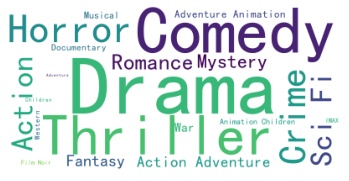

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


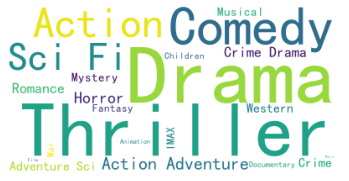

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


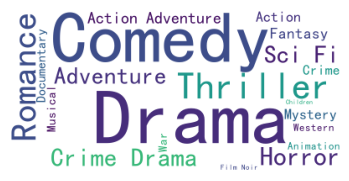

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


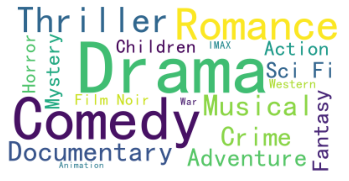

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


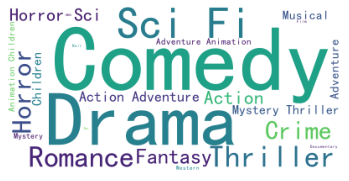

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


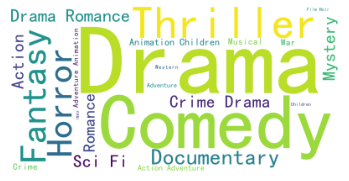

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


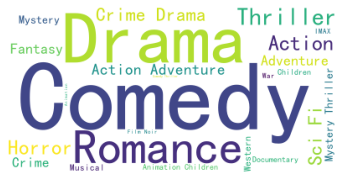

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


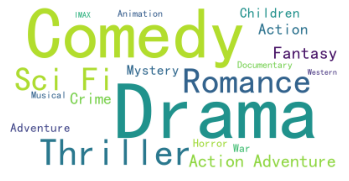

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


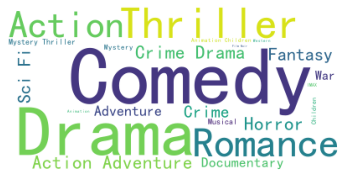

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


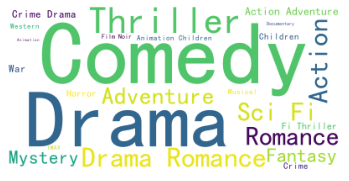

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


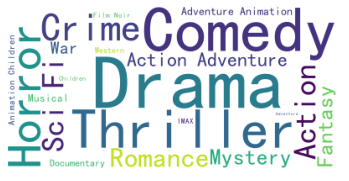

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


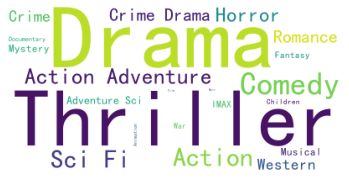

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


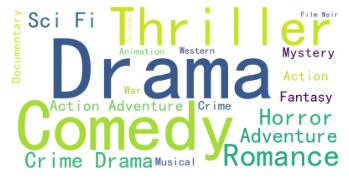

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


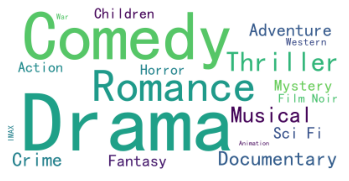

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


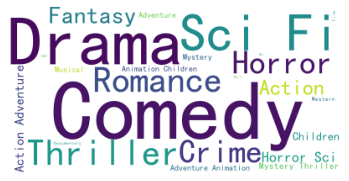

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


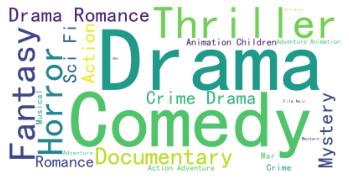

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


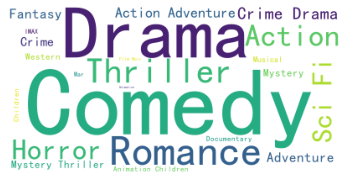

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 89299


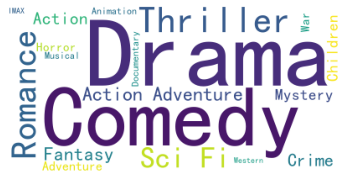

Hello, User 89299! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 131961


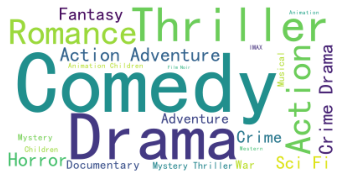

Hello, User 131961! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 92269


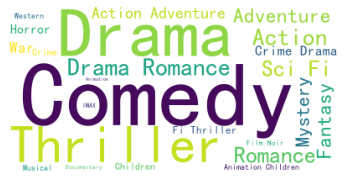

Hello, User 92269! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 46396


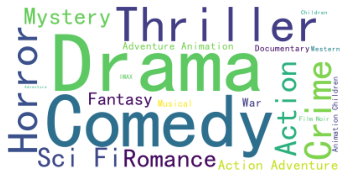

Hello, User 46396! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 80920


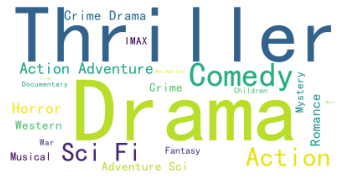

Hello, User 80920! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 50297


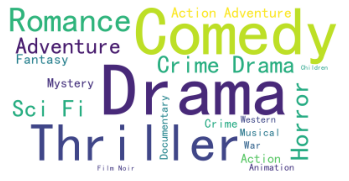

Hello, User 50297! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 65401


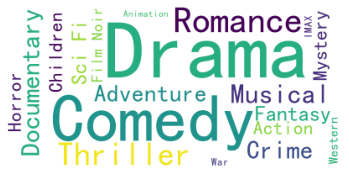

Hello, User 65401! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 45987


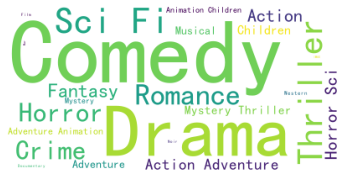

Hello, User 45987! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 114406


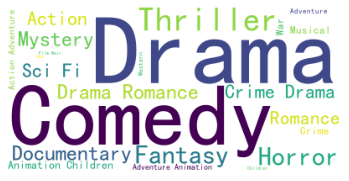

Hello, User 114406! According to your favoriate genres, we recommend you the folling movies: 
This is the worldcould for user 18138


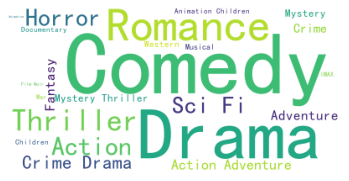

Hello, User 18138! According to your favoriate genres, we recommend you the folling movies: 


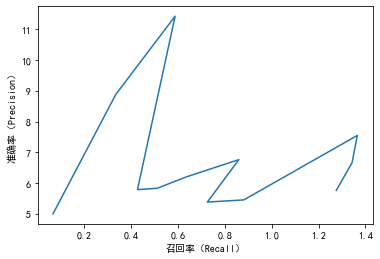

In [61]:
x = []
y = []
for n in range(4, 60, 5):    
    x1 = []
    y1 = []
    for i in testIndex:
        rank = GenresUserBased_recommemd(user_id = i, top_n = n)["movieId"].values.tolist()
        items = dict_ER[i]
        Precision, Recall = PrecisionRecall(rank = rank, items = items)
        x1.append(Recall)
        y1.append(Precision)
    x.append(statistics.mean(x1)*100)
    y.append(statistics.mean(y1)*100)
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.xlabel("召回率（Recall）")
plt.ylabel("准确率（Precision）")
plt.plot(x, y)
plt.savefig("../output/imgs/GenresCF_P-R_"+CF_METHOD+".png")
plt.show()